Environment Setup

In [2]:
!pip install ultralytics opencv-python numpy pandas matplotlib tqdm

In [3]:
# Install the required tracking dependencies
!pip install lap scikit-image filterpy

Video Mounting

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


create line in video frame

In [5]:
# Load model
from ultralytics import YOLO # Import the YOLO class

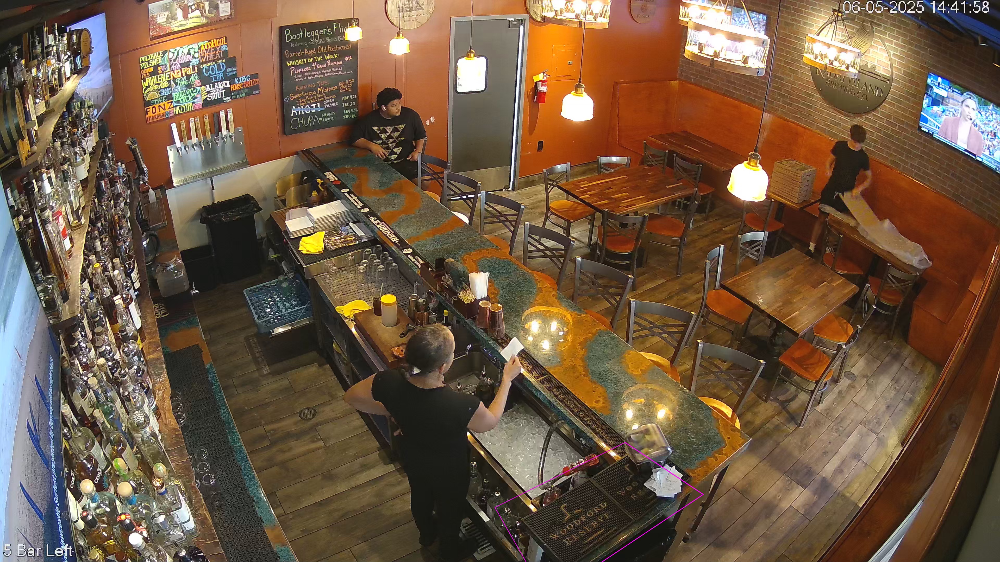

In [6]:
import cv2
from PIL import Image

video_path = "/content/drive/MyDrive/KoloaVideo/Koloa5.mp4"  # Update with your file path
cap = cv2.VideoCapture(video_path)

# Read the first frame
ret, frame = cap.read()

if ret:
# Define the four corner points of the ROI (example coordinates)
# These coordinates should be in the format [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
# Make sure these points define a convex polygon.
    roi_points = [(1900, 1950), (2400, 1700), (2700, 1900), (2100, 2300)] # Example: a quadrilateral

# You can adjust these coordinates to fit your specific video and desired counting area.

    # Convert roi_points to a numpy array of integers for cv2.polylines
    import numpy as np
    pts = np.array(roi_points, np.int32)
    pts = pts.reshape((-1, 1, 2))

    # Draw the quadrilateral on the frame
    # Color is pink (255, 0, 255), thickness is 2
    cv2.polylines(frame, [pts], True, (255, 0, 255), 2)


    # Save the frame with the line drawn on it
    cv2.imwrite("first_frame_with_roi.jpg", frame)

    # Display the saved frame in the notebook
    display(Image.open("first_frame_with_roi.jpg"))

    # Release the video capture object
    cap.release()
else:
    print("Failed to read video")

In [8]:
!ls /usr/local/lib/python3.*/dist-packages/ultralytics/cfg/trackers/


botsort.yaml  bytetrack.yaml


In [9]:
!cat /usr/local/lib/python3.*/dist-packages/ultralytics/cfg/trackers/botsort.yaml


# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Default Ultralytics settings for BoT-SORT tracker when using mode="track"
# For documentation and examples see https://docs.ultralytics.com/modes/track/
# For BoT-SORT source code see https://github.com/NirAharon/BoT-SORT

tracker_type: botsort # tracker type, ['botsort', 'bytetrack']
track_high_thresh: 0.25 # threshold for the first association
track_low_thresh: 0.1 # threshold for the second association
new_track_thresh: 0.25 # threshold for init new track if the detection does not match any tracks
track_buffer: 30 # buffer to calculate the time when to remove tracks
match_thresh: 0.8 # threshold for matching tracks
fuse_score: True # Whether to fuse confidence scores with the iou distances before matching
# min_box_area: 10  # threshold for min box areas(for tracker evaluation, not used for now)

# BoT-SORT settings
gmc_method: sparseOptFlow # method of global motion compensation
# ReID model related thresh
proxim

In [7]:
# Replace 30 with 10 in-place using sed
!sed -i 's/track_buffer: 30/track_buffer: 200/' /usr/local/lib/python3.*/dist-packages/ultralytics/cfg/trackers/botsort.yaml

In [8]:
!cat /usr/local/lib/python3.*/dist-packages/ultralytics/cfg/trackers/botsort.yaml

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Default Ultralytics settings for BoT-SORT tracker when using mode="track"
# For documentation and examples see https://docs.ultralytics.com/modes/track/
# For BoT-SORT source code see https://github.com/NirAharon/BoT-SORT

tracker_type: botsort # tracker type, ['botsort', 'bytetrack']
track_high_thresh: 0.25 # threshold for the first association
track_low_thresh: 0.1 # threshold for the second association
new_track_thresh: 0.25 # threshold for init new track if the detection does not match any tracks
track_buffer: 200 # buffer to calculate the time when to remove tracks
match_thresh: 0.8 # threshold for matching tracks
fuse_score: True # Whether to fuse confidence scores with the iou distances before matching
# min_box_area: 10  # threshold for min box areas(for tracker evaluation, not used for now)

# BoT-SORT settings
gmc_method: sparseOptFlow # method of global motion compensation
# ReID model related thresh
proxi

In [9]:
from IPython.display import display
from PIL import Image
import cv2
import numpy as np
from ultralytics import YOLO # Import the YOLO class

# Load model
model = YOLO("yolov8l.pt")  # Using a larger model

drink_classes = [41, 47]  # Class IDs for drinks

# --- Tunable Hyperparameters ---
confidence_threshold = 0.4
iou_threshold = 0.6
frame_buffer_threshold = 10  # New: Minimum number of frames in ROI before counting
# -------------------------------

# Run tracking (this part remains the same)
results = model.track(
    source=video_path,
    persist=True,
    conf=confidence_threshold,
    iou=iou_threshold,
    classes=drink_classes,
    tracker="botsort.yaml",
    save=False,
    stream=True,
)

# Video reader and writer
cap = cv2.VideoCapture(video_path, 0) # Read in grayscale
w, h = int(cap.get(3)), int(cap.get(4))
fps = cap.get(cv2.CAP_PROP_FPS)
out = cv2.VideoWriter("tracked_output.mp4", cv2.VideoWriter_fourcc(*'mp4v'), fps, (w, h))

frame_idx = 0
drink_count = 0
counted_ids = set()
id_frame_map = {}

# Define ROI polygon
roi_points = [(1900, 1950), (2400, 1700), (2700, 1900), (2100, 2300)]
pts = np.array(roi_points, np.int32).reshape((-1, 1, 2))

# Create a new video writer for cropped output
cropped_out = None # Initialize to None

# --- Tunable Hyperparameters for Cropping ---
padding = 50 # Add padding around the bounding boxes
# -------------------------------------------


# Calculate the bounding box of the ROI
min_x_roi = min(p[0] for p in roi_points)
min_y_roi = min(p[1] for p in roi_points)
max_x_roi = max(p[0] for p in roi_points)
max_y_roi = max(p[1] for p in roi_points)

# Add some padding to the ROI bounding box for the cropping
padding = 50  # You can adjust this padding as needed
min_x_crop = max(0, min_x_roi - padding)
min_y_crop = max(0, min_y_roi - padding)
max_x_crop = min(w, max_x_roi + padding)  # Use original video width/height
max_y_crop = min(h, max_y_roi + padding)

# Create a new video writer for cropped output
cropped_out = None # Initialize to None


for result in results:
    frame = result.orig_img.copy()
    # Make sure frame is grayscale (although reading with flag=0 should ensure this)
    if len(frame.shape) == 3:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    frame_idx += 1

    # Crop the frame based on the ROI bounding box
    cropped_frame = frame[min_y_crop:max_y_crop, min_x_crop:max_x_crop]

    # Convert cropped frame to BGR for drawing
    cropped_frame_display = cv2.cvtColor(cropped_frame, cv2.COLOR_GRAY2BGR)

    # Initialize cropped_out with dimensions of the first cropped frame
    if cropped_out is None:
        cropped_h, cropped_w = cropped_frame.shape[:2]
        cropped_out = cv2.VideoWriter("tracked_output_roi_cropped.mp4", cv2.VideoWriter_fourcc(*'mp4v'), fps, (cropped_w, cropped_h))


    # Adjust ROI points relative to the cropped frame
    adjusted_roi_points = []
    for point in roi_points:
        adjusted_x = point[0] - min_x_crop
        adjusted_y = point[1] - min_y_crop
        adjusted_roi_points.append((adjusted_x, adjusted_y))

    # Draw the ROI on the cropped frame
    adjusted_pts = np.array(adjusted_roi_points, np.int32).reshape((-1, 1, 2))
    cv2.polylines(cropped_frame_display, [adjusted_pts], True, (255, 0, 255), 2)


    if result.boxes.id is not None and len(result.boxes.id) > 0:
        ids = result.boxes.id.int().cpu().tolist()
        boxes = result.boxes.xyxy.cpu().numpy()
        clss = result.boxes.cls.cpu().numpy().astype(int)


        for i, id_ in enumerate(ids):
            cls = clss[i]
            if cls not in drink_classes:
                continue

            x1, y1, x2, y2 = boxes[i]
            cx, cy = int((x1 + x2) / 2), int((y1 + y2) / 2)

            # Adjust bounding box coordinates relative to the cropped frame
            adjusted_x1 = int(x1 - min_x_crop)
            adjusted_y1 = int(y1 - min_y_crop)
            adjusted_x2 = int(x2 - min_x_crop)
            adjusted_y2 = int(y2 - min_y_crop)
            adjusted_cx = int(cx - min_x_crop)
            adjusted_cy = int(cy - min_y_crop)


            # Draw bounding box and ID on the display frame (only if it's within the cropped area)
            # We need to check if the adjusted coordinates are within the bounds of the cropped frame
            if adjusted_x1 < cropped_w and adjusted_y1 < cropped_h and adjusted_x2 > 0 and adjusted_y2 > 0:
                cv2.rectangle(cropped_frame_display, (adjusted_x1, adjusted_y1), (adjusted_x2, adjusted_y2), (0, 255, 0), 2)
                cv2.putText(cropped_frame_display, f"ID:{id_}", (adjusted_x1, adjusted_y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
                cv2.circle(cropped_frame_display, (adjusted_cx, adjusted_cy), 5, (255, 0, 255), -1)


            # Check ROI containment using original coordinates (since roi_points are in original frame coords)
            inside_roi = cv2.pointPolygonTest(pts, (cx, cy), False) >= 0

            if inside_roi:
                id_frame_map[id_] = id_frame_map.get(id_, 0) + 1
                if id_frame_map[id_] == frame_buffer_threshold and id_ not in counted_ids:
                    drink_count += 1
                    counted_ids.add(id_)
            else:
                id_frame_map.pop(id_, None)


    # Draw counter on the display frame
    cv2.putText(cropped_frame_display, f"Drink Count: {drink_count}", (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 0, 255), 3)


    cropped_out.write(cropped_frame_display)


cap.release()
if cropped_out is not None:
    cropped_out.release()

print("✅ Done! Output saved as: tracked_output_roi_cropped.mp4")


video 1/1 (frame 1/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 84.7ms
video 1/1 (frame 2/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 40.5ms
video 1/1 (frame 3/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 40.2ms
video 1/1 (frame 4/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 40.1ms
video 1/1 (frame 5/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 40.2ms
video 1/1 (frame 6/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 40.2ms
video 1/1 (frame 7/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 40.2ms
video 1/1 (frame 8/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 40.2ms
video 1/1 (frame 9/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 40.2ms
video 1/1 (frame 10/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.mp4: 384x640 1 cup, 40.2ms
video 1/1 (frame 11/3180) /content/drive/MyDrive/KoloaVideo/Koloa5.m

In [12]:
from google.colab import files

files.download('tracked_output_roi_cropped.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
print(model.names)

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw